In [94]:
import pandas as pd
import string
import re
from string import digits
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from gensim import corpora
import gensim
import matplotlib.pyplot as plt
import spacy

In [95]:
df = pd.read_csv('time_article.csv')
df1 = pd.read_csv('merged_cleaned_TheGuardians.csv')
df2 = pd.read_csv('merged_cleaned_Reuters.csv')
# df2 = pd.read_csv()

In [96]:
df = df.drop(columns = ['Unnamed: 0', 'author'])
df1 = df1.drop(columns = ['Unnamed: 0', 'standfirst', 'author'])
df2 = df2.drop(columns = ['Unnamed: 0'])
article = pd.concat([df1,df2])
# article = df1
article.reset_index(drop=True)

,content,headline,time
0,Fearful of facing public wrath in a heated pol...,More US firms than ever get transparent over p...,2019-10-24/13:00:49
1,Boris Johnson’s 31 October “do or die” Brexit ...,Brexit 'do or die': what are Boris Johnson's o...,2019-10-24/12:58:43
2,A Chinese orienteering team has been disqualif...,Chinese orienteering team disqualified for che...,2019-10-24/12:27:17
3,In the newly published Conversations on Confli...,Five conflict photographers on some of the har...,2019-10-24/12:00:11
4,A tourist is facing charges of kidnapping afte...,Venice tourist 'kidnaps' currency exchange wor...,2019-10-24/11:47:55
...,...,...,...
25236,WASHINGTON - The U.S. Supreme Court on Monda...,Merck loses bid to revive $200 million Gilead ...,"January 7, 2019 / 2:56 PM"
25237,BRASILIA - Brazil national security adviser ...,Brazil studying if Boeing-Embraer deal is in i...,"January 7, 2019 / 2:41 PM"
25238,WASHINGTON - The Pentagon has notified the U...,Pentagon notified U.S. Congress of $593 millio...,"August 30, 2017 / 10:43 PM"
25239,WASHINGTON - The Interior Department’s inspe...,Interior Department watchdog drops probe of th...,"August 30, 2017 / 10:09 PM"


In [97]:
def preprocessing(x):
    x = x.lower()
#     x = x.replace('—', ' ')
    x = re.sub('[\W_]+', ' ', x, flags=re.UNICODE) 
    x = re.sub('\w+@\w+\.[a-z]{3}', ' ', x)
#     x = re.sub('—', ' ', x)
#     pattern = r'[^a-zA-z0-9\s]'
#     text = re.sub(pattern, '', x)
    x = x.translate(str.maketrans(" ", " ", string.punctuation))
    x = x.translate(str.maketrans('', '', digits))
    x = x.replace('“', '')
    x = x.replace('”', '')
    x = x.replace('reuters', '')
#     x = x.replace('…', '')
#     x = x.replace('’', '')
#     x = x.replace('‘', '')  
#     x = ' '.join(x.split())
#     x = x.split('—')
#     print(x)
#     if(x[0].isupper()):
#         x = x[1:]
#     x = ' '.join(x)
#     x = x.strip()
#     x = x.replace('  ', '')
    return x
article['cleaned_content'] = article['content'].apply(preprocessing)
# print(article['content'][1])
# article['cleaned_content'][1]
article

,content,headline,time,cleaned_content
0,Fearful of facing public wrath in a heated pol...,More US firms than ever get transparent over p...,2019-10-24/13:00:49,fearful of facing public wrath in a heated pol...
1,Boris Johnson’s 31 October “do or die” Brexit ...,Brexit 'do or die': what are Boris Johnson's o...,2019-10-24/12:58:43,boris johnson s october do or die brexit dead...
2,A Chinese orienteering team has been disqualif...,Chinese orienteering team disqualified for che...,2019-10-24/12:27:17,a chinese orienteering team has been disqualif...
3,In the newly published Conversations on Confli...,Five conflict photographers on some of the har...,2019-10-24/12:00:11,in the newly published conversations on confli...
4,A tourist is facing charges of kidnapping afte...,Venice tourist 'kidnaps' currency exchange wor...,2019-10-24/11:47:55,a tourist is facing charges of kidnapping afte...
...,...,...,...,...
14318,WASHINGTON - The U.S. Supreme Court on Monda...,Merck loses bid to revive $200 million Gilead ...,"January 7, 2019 / 2:56 PM",washington the u s supreme court on monday han...
14319,BRASILIA - Brazil national security adviser ...,Brazil studying if Boeing-Embraer deal is in i...,"January 7, 2019 / 2:41 PM",brasilia brazil national security adviser augu...
14320,WASHINGTON - The Pentagon has notified the U...,Pentagon notified U.S. Congress of $593 millio...,"August 30, 2017 / 10:43 PM",washington the pentagon has notified the u s c...
14321,WASHINGTON - The Interior Department’s inspe...,Interior Department watchdog drops probe of th...,"August 30, 2017 / 10:09 PM",washington the interior department s inspector...


In [98]:
documents = article['cleaned_content'].values.tolist()
cleaned_text = []
lemmatized_text = []
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatization(texts, allowed_postags=['NOUN']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

def first_clean(x):
    new = []
    #tokenize
    tokens = word_tokenize(x)
    #removing stop words
    result = [i for i in tokens if not i in ENGLISH_STOP_WORDS and len(i) >3]
    return result

for document in documents:
    cleaned_text.append(first_clean(document))

# lemmatized_words[0]
    
# article['cleaned_headline'].apply(text_prep)
cleaned_text

[['fearful',
  'facing',
  'public',
  'wrath',
  'heated',
  'political',
  'environment',
  'record',
  'number',
  'companies',
  'adopted',
  'stronger',
  'transparency',
  'accountability',
  'practices',
  'political',
  'spending',
  'according',
  'report',
  'protests',
  'boycotts',
  'like',
  'recent',
  'campaigns',
  'equinox',
  'soulcycle',
  'support',
  'association',
  'donald',
  'trump',
  'pushed',
  'companies',
  'embrace',
  'sunlight',
  'according',
  'zicklin',
  'index',
  'partisan',
  'scorecard',
  'released',
  'center',
  'political',
  'accountability',
  'zicklin',
  'center',
  'university',
  'pennsylvania',
  'wharton',
  'school',
  'report',
  'registers',
  'largest',
  'year',
  'year',
  'increase',
  'number',
  'companies',
  'index',
  'scoring',
  'highest',
  'possible',
  'grades',
  'disclosure',
  'oversight',
  'election',
  'related',
  'spending',
  'index',
  'published',
  'annually',
  'takes',
  'account',
  'soft',
  'money',

In [99]:
# cleaned_text
bigram = gensim.models.Phrases(cleaned_text, min_count=5, threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

# lemmatized_text = lemmatization(cleaned_text)
bigram_text = make_bigrams(cleaned_text)

bigram_text

[['fearful',
  'facing',
  'public',
  'wrath',
  'heated',
  'political',
  'environment',
  'record',
  'number',
  'companies',
  'adopted',
  'stronger',
  'transparency_accountability',
  'practices',
  'political',
  'spending',
  'according',
  'report',
  'protests',
  'boycotts',
  'like',
  'recent',
  'campaigns',
  'equinox',
  'soulcycle',
  'support',
  'association',
  'donald_trump',
  'pushed',
  'companies',
  'embrace',
  'sunlight',
  'according',
  'zicklin',
  'index',
  'partisan',
  'scorecard',
  'released',
  'center',
  'political',
  'accountability',
  'zicklin',
  'center',
  'university',
  'pennsylvania',
  'wharton',
  'school',
  'report',
  'registers',
  'largest',
  'year',
  'year',
  'increase',
  'number',
  'companies',
  'index',
  'scoring',
  'highest',
  'possible',
  'grades',
  'disclosure',
  'oversight',
  'election',
  'related',
  'spending',
  'index',
  'published',
  'annually',
  'takes',
  'account',
  'soft',
  'money',
  'contri

In [100]:
# lemmatized_text

In [112]:
# Create Dictionary
id2word = corpora.Dictionary(bigram_text)
id2word.filter_extremes(no_below=20, no_above=0.75, keep_n = 50000)
# Create Corpus
texts = bigram_text

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [113]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=200,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)
#         model=gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        model_list.append(lda_model)
        coherencemodel = gensim.models.CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

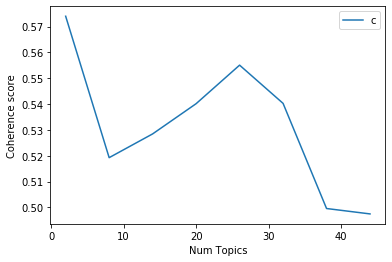

In [114]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=bigram_text, start=2, limit=50, step=6)
# Show graph

limit=50; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show();

In [118]:
#creating LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=32, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=200,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

lda_model.print_topics()

[(10,
  '0.117*"hong_kong" + 0.080*"city" + 0.053*"protests" + 0.039*"police" + 0.031*"protest" + 0.027*"people" + 0.023*"local" + 0.022*"protesters" + 0.018*"violence" + 0.018*"activists"'),
 (25,
  '0.196*"mexico" + 0.098*"border" + 0.095*"wall" + 0.059*"united_states" + 0.056*"north" + 0.051*"mexican" + 0.050*"america" + 0.034*"american" + 0.019*"security" + 0.017*"city"'),
 (11,
  '0.095*"immigration" + 0.062*"children" + 0.043*"people" + 0.026*"illegally" + 0.026*"young" + 0.022*"deportation" + 0.022*"country" + 0.020*"visa" + 0.019*"families" + 0.019*"illegal_immigrants"'),
 (12,
  '0.061*"puerto_rico" + 0.055*"africa" + 0.045*"african" + 0.033*"king" + 0.032*"norway" + 0.031*"spoke_condition" + 0.031*"norwegian" + 0.026*"anonymity" + 0.026*"royal" + 0.020*"positioned"'),
 (6,
  '0.079*"products" + 0.075*"brazil" + 0.052*"food" + 0.046*"amazon" + 0.036*"retailers" + 0.036*"farmers" + 0.032*"agriculture" + 0.026*"stores" + 0.025*"farm" + 0.022*"agricultural"'),
 (17,
  '0.170*"jap

In [119]:
print(lda_model.log_perplexity(corpus))
coherence_model_lda = gensim.models.CoherenceModel(model=lda_model, texts=bigram_text, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

-12.303719847767226

Coherence Score:  0.540300102609808


In [181]:
result = sorted(lda_model.print_topics(num_topics=32), key=lambda x:x[0])
result

[(0,
  '0.032*"year" + 0.019*"growth" + 0.017*"market" + 0.011*"economy" + 0.010*"rose" + 0.010*"markets" + 0.010*"analysts" + 0.010*"quarter" + 0.010*"sales" + 0.010*"global"'),
 (1,
  '0.047*"production" + 0.027*"industry" + 0.024*"energy" + 0.018*"opec" + 0.015*"output" + 0.012*"power" + 0.011*"million" + 0.010*"producer" + 0.010*"plants" + 0.010*"according"'),
 (2,
  '0.059*"sanctions" + 0.054*"iran" + 0.036*"united_states" + 0.030*"nuclear" + 0.026*"military" + 0.021*"washington" + 0.020*"foreign" + 0.018*"state" + 0.015*"defense" + 0.015*"russia"'),
 (3,
  '0.024*"policy" + 0.016*"rules" + 0.013*"bankruptcy" + 0.012*"crisis" + 0.012*"world" + 0.011*"countries" + 0.010*"need" + 0.009*"changes" + 0.009*"policies" + 0.009*"public"'),
 (4,
  '0.024*"health" + 0.022*"drug" + 0.020*"healthcare" + 0.018*"policymakers" + 0.014*"women" + 0.013*"drugs" + 0.012*"cancer" + 0.011*"people" + 0.011*"insurance" + 0.010*"research"'),
 (5,
  '0.030*"deal" + 0.013*"monday" + 0.012*"tuesday" + 0.012

In [232]:
topic_list = ['x', 'x', 'Iran Sanctions', 'x', 'x', 'x', 'Amazon Fire', 'x', 'x', 'x', 'Hong Kong Protests',  
              'USA Immigration','x', 'x', 'x', 'Brexit', 'Boeing Crisis','x', 'Huawei Ban', 
             'Venezuela Oil Crisis','x','x', 'US Government Shutdown', 'Mueller Probe', 
             'x','x','x','US China Trade War','x','x','x', 'x']
topic_dict = {}

for i in range(len(topic_list)):
    topic_dict[i] = topic_list[i]
    
print(topic_dict)

{0: 'x', 1: 'x', 2: 'Iran Sanctions', 3: 'x', 4: 'x', 5: 'x', 6: 'Amazon Fire', 7: 'x', 8: 'x', 9: 'x', 10: 'Hong Kong Protests', 11: 'USA Immigration', 12: 'x', 13: 'x', 14: 'x', 15: 'Brexit', 16: 'Boeing Crisis', 17: 'x', 18: 'Huawei Ban', 19: 'Venezuela Oil Crisis', 20: 'x', 21: 'x', 22: 'US Government Shutdown', 23: 'Mueller Probe', 24: 'x', 25: 'x', 26: 'x', 27: 'US China Trade War', 28: 'x', 29: 'x', 30: 'x', 31: 'x'}


In [233]:
result = lda_model.get_document_topics(corpus[0])
prob_distrib = sorted(result, key = lambda tup: tup[1], reverse=True)
# output = [x[1] for x in result]
def assigning(corpus,topic_dict):
    output = []
    probability = []
    for i in range(len(corpus)):
        result = lda_model.get_document_topics(corpus[i])
#         print(result)
        prob_distrib = sorted(result, key = lambda tup: tup[1], reverse=True)
#         print(pro)
        output.append(topic_dict[prob_distrib[0][0]])
        probability.append(prob_distrib[0][1])
    return output, probability

topic_df, probability = assigning(corpus, topic_dict)
article['topic'] = pd.DataFrame(topic_df)
article['probability'] = pd.DataFrame(probability)

In [235]:
to_csv = article[article['topic'] != 'x']
# to_csv
irs = to_csv[to_csv['topic'] == 'Hong Kong Protests']
# irs.sort_values(by='probability', ascending=False)
# irs.to_csv('Iran Sanctions.csv', encoding = 'utf-8-sig')